In [1]:
from src.tasks.base_task import AllConditionalTask

import jax 
import jax.numpy as jnp

from probjax.inference.mcmc import MCMC
from probjax.inference.marcov_kernels import HMCKernel, GaussianMHKernel, SliceKernel, LangevianMHKernel

from probjax.core import joint_sample, log_potential_fn, rv, intervene, JaxprGraph
from probjax.distributions import Normal 
from probjax.utils.jaxutils import ravel_args


import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from functools import partial

In [2]:
# Use CPU as default

jax.config.update("jax_platform_name", "cpu")

## Nonlinear gaussian tree

$\theta_1 \sim \mathcal{N}(0, 1)$

$\theta_2 \sim \mathcal{N}(\theta_1, 1)$

$\theta_3 \sim \mathcal{N}(\theta_1, 1)$

$x_1 \sim \mathcal{N}(2\sin(\theta_2), 0.5)$

$x_2 \sim \mathcal{N}(0.1 * \theta_2^2 + x_1, 0.2)$

$x_3 \sim \mathcal{N}(\cos(\theta_3), 1.5)$

$x_4 \sim \mathcal{N}(0.1 * \theta_3^2 + x_3, 0.2)$

In [90]:
def model(key):
    key1, key2, key3, key4, key5, key6, key7, key8 = jax.random.split(key, 8)
    theta1 = rv(Normal(jnp.zeros((1,)), 1.), name = "theta1")(key1)
    theta2 = rv(Normal(theta1, 1.), name = "theta2")(key2)
    theta3 = rv(Normal(theta1, 1.), name = "theta3")(key3)
    z1 = jnp.sin(theta2)**2
    z2 = 0.1*theta2**2
    z3 = 0.1*theta3**2
    z4 = jnp.cos(theta3)**2
    x1 = rv(Normal(z1, 0.2), name = "x1")(key5)
    x2 = rv(Normal(z2, 0.2), name = "x2")(key6)
    x3 = rv(Normal(z3, 0.6), name = "x3")(key7)
    x4 = rv(Normal(z4, 0.1), name = "x4")(key8)
    
    
    

In [91]:
key = jax.random.PRNGKey(1)

joint_sampler = joint_sample(model)
potential_fn = log_potential_fn(joint_sampler)

{}


/tmp/ipykernel_11729/729330013.py:2: DeprecationWarning: jax.tree_flatten is deprecated: use jax.tree_util.tree_flatten.
  samples = jnp.stack(jax.tree_flatten(samples)[0]).T


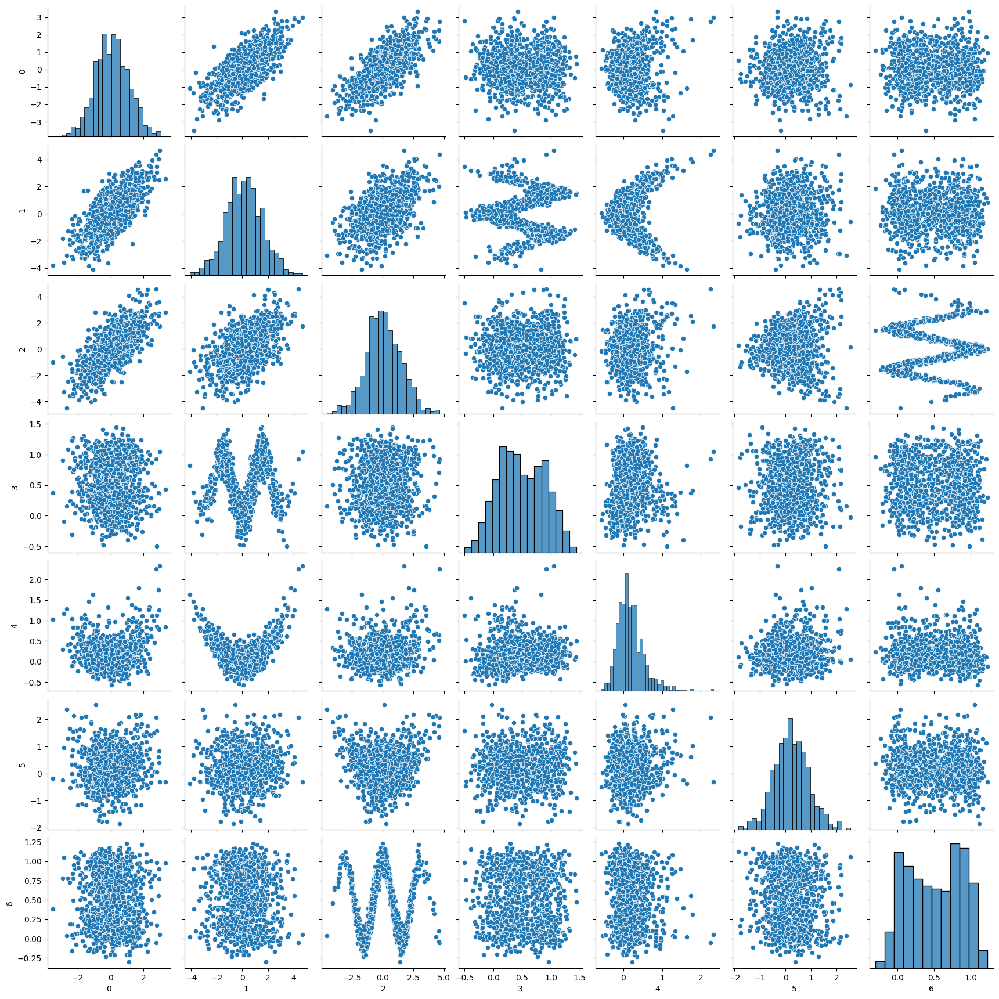

In [92]:
samples = jax.vmap(joint_sampler)(jax.random.split(key, (1000,)))
samples = jnp.stack(jax.tree_flatten(samples)[0]).T

sns.pairplot(pd.DataFrame(samples[0]))

In [93]:
var_names = ["theta1", "theta2", "theta3", "x1", "x2", "x3", "x4"]

In [103]:
@partial(jax.vmap, in_axes = [0, None, None])
def sample_fn(key, condition_mask, x_o):

    conditioned_names = [var_names[i] for i in range(len(var_names)) if condition_mask[i]]
    conditioned_nodes = {var: val for var, val in zip(conditioned_names, x_o)}
    

    init_vals = joint_sampler(key)

    for var in conditioned_nodes:
        del init_vals[var]
    
    

    init_vals_flat, unravel = ravel_args(init_vals)
    potential_fn = log_potential_fn(joint_sampler)


    @jax.jit
    def potential_fn_wrapper(vals):
        vals = unravel(vals)
        return potential_fn(**vals, **conditioned_nodes)

    kernel = HMCKernel()
    state = kernel.init_state(key,init_vals_flat)
    mcmc = MCMC(kernel, potential_fn_wrapper)
    samples, state = mcmc.run(state, 5000)
    return samples

In [104]:
x_o = jnp.stack(jax.tree_util.tree_flatten(joint_sampler(key))[0])

In [105]:
condition_mask = jnp.array([0, 0, 0,1,0,0,1], dtype = bool)
samples = sample_fn(jax.random.split(key, (1000,)), condition_mask, x_o)

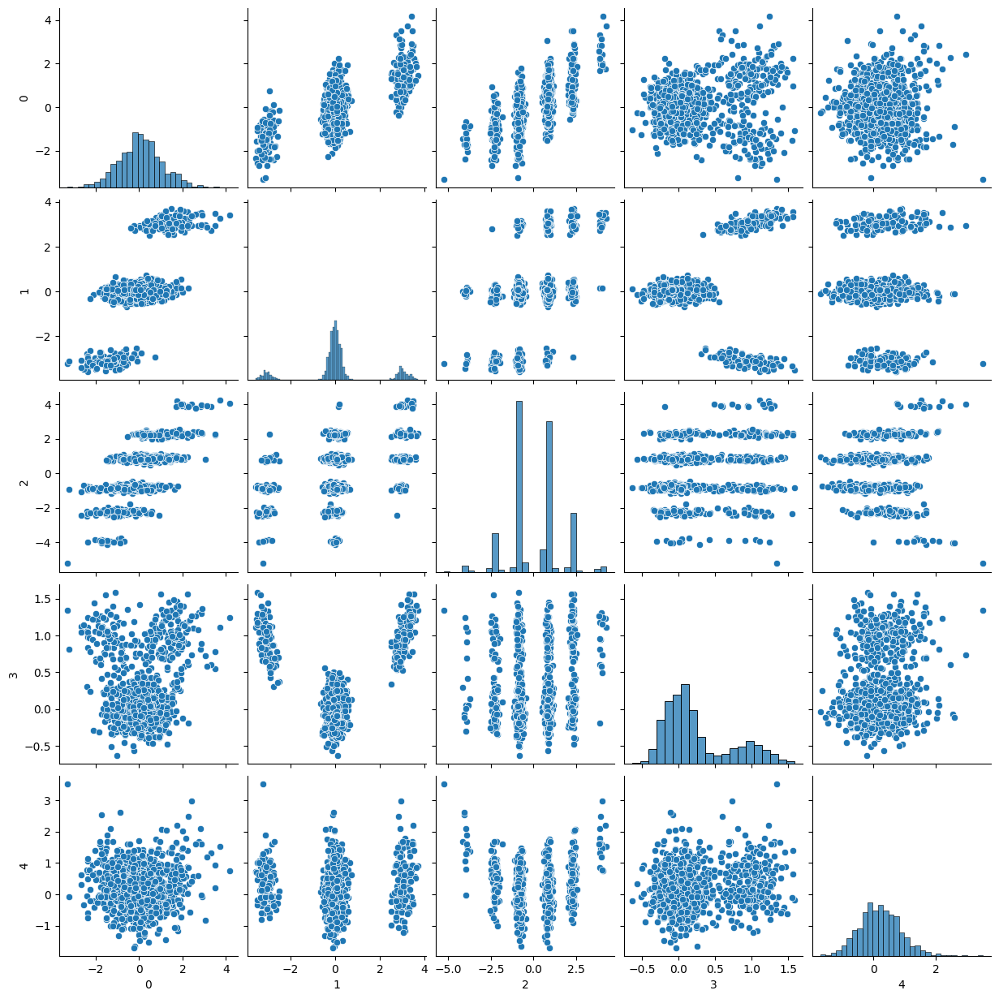

In [106]:
sns.pairplot(pd.DataFrame(samples))

# Model 2: Nonlinear Marcov Chain

In [6]:
def model2(key):
    key_thetas, key_xs = jax.random.split(key, 2)
    
    key_thetas, key_theta0 = jax.random.split(key_thetas, 2)
    key_xs, key_x0 = jax.random.split(key_xs, 2)
    theta0 = rv(Normal(jnp.zeros((1,)), 0.5), name = f"theta0")(key_theta0)
    x0 = rv(Normal(theta0**2, 0.5), name = f"x0")(key_x0)
    for i in range(1, 10):
        key_thetas, key_theta_i = jax.random.split(key_thetas, 2)
        key_xs, key_xi = jax.random.split(key_xs, 2)
        theta_i = rv(Normal(theta0, 0.5), name = f"theta{i}")(key_theta_i)
        x1 = rv(Normal(theta_i**2, 0.5), name = f"x{i}")(key_xi)
        theta0 = theta_i
            

In [7]:
var_names = [f"theta{i}" for i in range(10)] + [f"x{i}" for i in range(10)]

key = jax.random.PRNGKey(1)

joint_sampler = joint_sample(model2)
potential_fn = log_potential_fn(joint_sampler)

/tmp/ipykernel_15994/729330013.py:2: DeprecationWarning: jax.tree_flatten is deprecated: use jax.tree_util.tree_flatten.
  samples = jnp.stack(jax.tree_flatten(samples)[0]).T


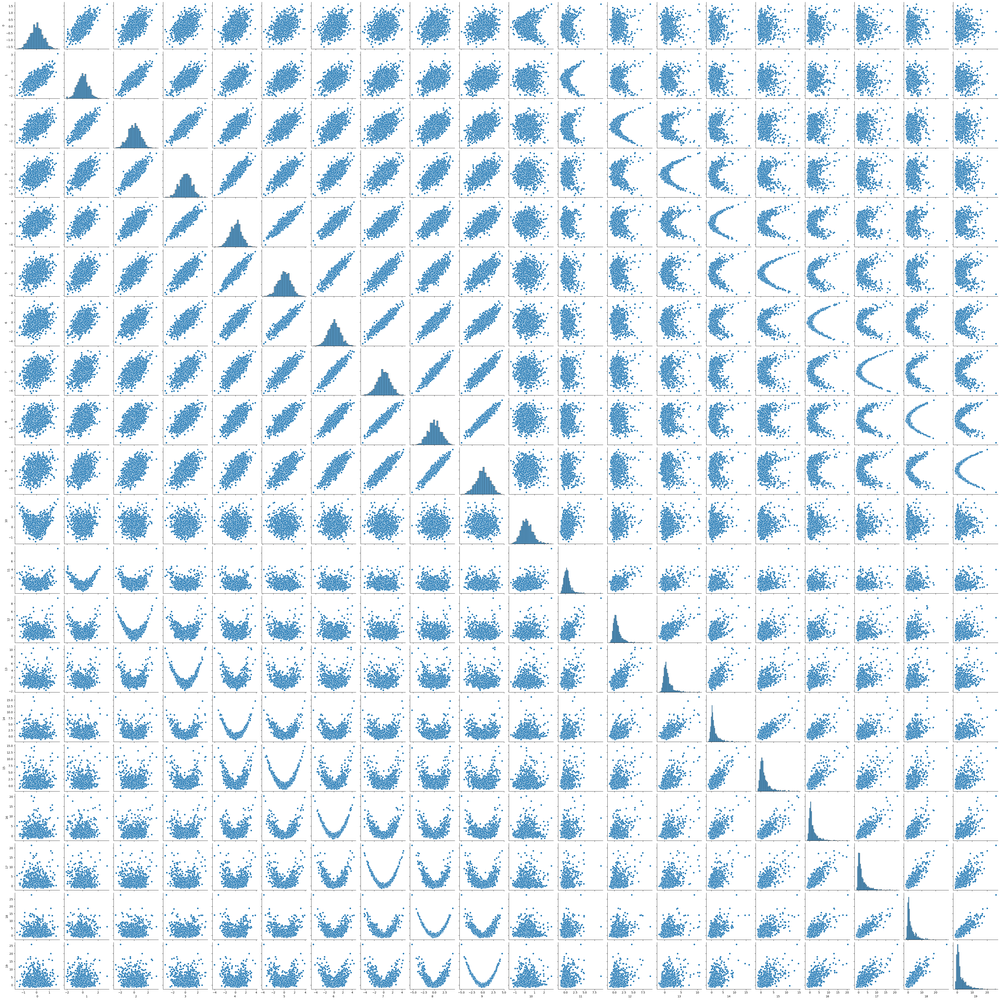

In [8]:
samples = jax.vmap(joint_sampler)(jax.random.split(key, (1000,)))
samples = jnp.stack(jax.tree_flatten(samples)[0]).T

sns.pairplot(pd.DataFrame(samples[0]))

In [27]:
@partial(jax.vmap, in_axes = [0, None, None])
def sample_fn(key, condition_mask, x_o):

    conditioned_names = [var_names[i] for i in range(len(var_names)) if condition_mask[i]]
    conditioned_nodes = {var: val for var, val in zip(conditioned_names, x_o)}
    

    init_vals = joint_sampler(key)

    for var in conditioned_nodes:
        del init_vals[var]
    
    

    init_vals_flat, unravel = ravel_args(init_vals)
    potential_fn = log_potential_fn(joint_sampler)


    @jax.jit
    def potential_fn_wrapper(vals):
        vals = unravel(vals)
        return potential_fn(**vals, **conditioned_nodes)

    kernel = HMCKernel()
    state = kernel.init_state(key,init_vals_flat)
    mcmc = MCMC(kernel, potential_fn_wrapper)
    samples, state = mcmc.run(state, 10000)
    return samples

In [28]:
x_o = jnp.squeeze(jnp.stack(jax.tree_util.tree_flatten(joint_sampler(key + 3))[0]))

In [25]:
condition_mask = jnp.array([0]*10 + [1]*10, dtype = bool)
samples = sample_fn(jax.random.split(key, (1000,)), condition_mask, x_o[10:])

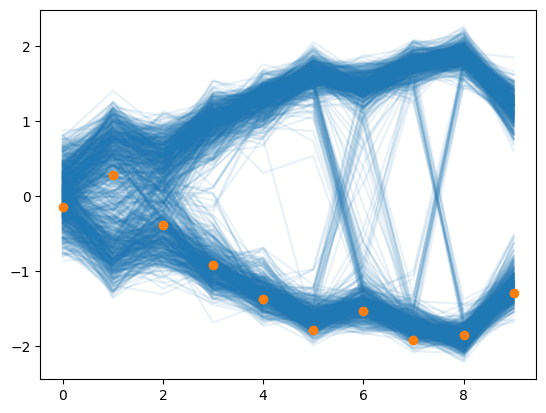

In [26]:
_ = plt.plot(samples.T, color="C0", alpha=0.1)
_ = plt.plot(x_o[:10], "o", color="C1", lw=2)

# SLCP

In [7]:
from probjax.distributions.transformed_distribution import TransformedDistribution
from probjax.distributions import Uniform, Independent, MultivariateNormal
from probjax.core import inverse

In [8]:
from sbi.analysis import pairplot
import numpy as np

In [9]:
def model3(key):

    key1, key2, key3, key4, key5, key6, key7, key8, key9, key10 = jax.random.split(key, 10)
    #prior = TransformedDistribution(Uniform(jnp.array([-3.]), jnp.array([3.])), lambda x: jnp.arctanh(x/3))
    prior = Uniform(jnp.array([-3.]), jnp.array([3.]))
    theta0 = rv(prior, name = "theta0")(key1)
    theta1 = rv(prior, name = "theta1")(key2)
    theta2 = rv(prior, name = "theta2")(key3)
    theta3 = rv(prior, name = "theta3")(key4)
    theta4 = rv(prior, name = "theta4")(key5)
    
    # theta0 = jnp.tanh(theta0)*3
    # theta1 = jnp.tanh(theta1)*3
    # theta2 = jnp.tanh(theta2)*3
    # theta3 = jnp.tanh(theta3)*3
    # theta4 = jnp.tanh(theta4)*3

    #key1, key2, key3, key4 = jrandom.split(key, 4)
    mean = jnp.stack([theta0, theta1]).squeeze()
    s_1 = theta2**2
    s_2 = theta3**2
    rho = jnp.tanh(theta4)
    eps = 0.000001
    cov = jnp.array([[s_1**2, rho*s_1*s_2], [rho*s_1*s_2, s_2**2]]).squeeze() + eps*jnp.eye(2)
    p = MultivariateNormal(mean, cov)
    x1 = rv(p, name = "x0")(key6)
    x2 = rv(p, name = "x1")(key7)
    x3 = rv(p, name = "x2")(key8)
    x4 = rv(p, name = "x3")(key9)    

In [7]:
var_names = [f"theta{i}" for i in range(5)] + [f"x{i}" for i in range(4)]

key = jax.random.PRNGKey(1)

joint_sampler = joint_sample(model3)
potential_fn = log_potential_fn(joint_sampler)

{}


In [8]:
joint_sampler(key)

{'theta0': Array([0.649], dtype=float32),
 'theta1': Array([-1.974], dtype=float32),
 'theta2': Array([2.253], dtype=float32),
 'theta3': Array([1.247], dtype=float32),
 'theta4': Array([-1.06], dtype=float32),
 'x0': Array([ 0.929, -1.775], dtype=float32),
 'x1': Array([13.712, -5.62 ], dtype=float32),
 'x2': Array([ 5.47 , -2.386], dtype=float32),
 'x3': Array([-4.85, -2.25], dtype=float32)}

In [7]:
@partial(jax.vmap, in_axes = [0, None, None])
def sample_fn(key, condition_mask, x_o):

    conditioned_names = [var_names[i] for i in range(len(var_names)) if condition_mask[i]]
    conditioned_nodes = {var: val for var, val in zip(conditioned_names, x_o)}
    

    init_vals = joint_sampler(key)

    for var in conditioned_nodes:
        del init_vals[var]
    
    
    print(conditioned_nodes)
    init_vals_flat, unravel = ravel_args(init_vals)
    potential_fn = log_potential_fn(joint_sampler)


    @jax.jit
    def potential_fn_wrapper(vals):
        vals = unravel(vals)
        return potential_fn(**vals, **conditioned_nodes)

    kernel1 = SliceKernel()
    kernel2 = GaussianMHKernel(step_size=0.1)
    state = kernel1.init_state(key,init_vals_flat)
    mcmc = MCMC(kernel1, potential_fn_wrapper)
    samples, state = mcmc.run(state, 100)
    mcmc2 = MCMC(kernel2, potential_fn_wrapper)
    samples, state = mcmc2.run(state, 2000)
    
    return samples

In [62]:
x_o = jnp.squeeze(jnp.concatenate(jax.tree_util.tree_flatten(joint_sampler(key+43))[0]))

In [59]:
condition_mask = jnp.array([0]*5 + [1]*8, dtype = bool)
samples = sample_fn(jax.random.split(key, (10000,)), condition_mask, jnp.array(x_o_sbibm.reshape(4,2)))

{'x0': Array([2.372, 0.499], dtype=float32), 'x1': Array([9.931, 1.714], dtype=float32), 'x2': Array([-10.436,  -1.907], dtype=float32), 'x3': Array([-1.234, -0.097], dtype=float32)}


In [17]:

import sbibm
import torch
from sbi.analysis.sbc import c2st

task = sbibm.get_task("slcp")

for i in range(1, 10):
    x_o_sbibm = task.get_observation(i)[0]
    reference_posterior = task.get_reference_posterior_samples(i)
    
    x_o_sbibm = jnp.array(x_o_sbibm.reshape(4,2))
    condition_mask = jnp.array([0]*5 + [1]*8, dtype = bool)
    samples = sample_fn(jax.random.split(key, (10000,)), condition_mask, x_o_sbibm)
    
    print(c2st(torch.tensor(np.array(samples)), torch.tensor(np.array(reference_posterior))))
    

NameError: name 'joint_sampler' is not defined

# Two Moons

With latent variables

In [10]:

import math 
from probjax.distributions import Dirac
import sbibm 
from sbi.analysis.sbc import c2st

In [20]:
sqrt2 = math.sqrt(2)

def model5(key):
    """Simulator for the two moons problem."""
    key1, key2,key3, key4 = jax.random.split(key,4)
    
    theta0 = rv(Uniform(jnp.array([-1.]), jnp.array([1.])), name = "theta0")(key1)
    theta1 = rv(Uniform(jnp.array([-1.]), jnp.array([1.])), name = "theta1")(key2)
    
    p = rv(Normal(jnp.array([0.1]), 0.01), "r")
    u = rv(Uniform(-0.5 * jnp.pi, 0.5 * jnp.pi), "alpha")
    r = p(key1)
    alpha = u(key2)
    rhs1 = rv(Dirac((r * jnp.cos(alpha) + 0.25) + (-jnp.abs(theta0 + theta1) / sqrt2)), "x0")(key3)
    rhs2 = rv(Dirac((r * jnp.sin(alpha)) + ((theta1 - theta0) / sqrt2)), "x1")(key4)


In [34]:
var_names = [f"theta{i}" for i in range(2)] + [f"x{i}" for i in range(2)]

key = jax.random.PRNGKey(1)

joint_sampler = joint_sample(model5, rvs=["theta0", "theta1", "x0", "x1"])

def potential_fn(theta0, theta1, x0, x1):
    ang = -jnp.pi / 4.0
    c = jnp.cos(ang)
    s = jnp.sin(ang)
    z0 = -jnp.abs(c * theta0 - s * theta1)
    z1 = s * theta0 + c * theta1
    
    u = x0 - z0 - 0.25
    v = x1 - z1
    
    r = jnp.sqrt(u**2 + v**2)
    
    likelihood = jax.scipy.stats.norm.logpdf(r, 0.1, 0.01)
    likelihood = jnp.where(u < 0, -jnp.inf, likelihood)
    likelihood = jnp.where((theta0 < -1.) | (theta1 < -1.) | (theta0 > 1.) | (theta1 > 1.), -jnp.inf, likelihood)
    
    return likelihood
    

{}


In [49]:
@partial(jax.vmap, in_axes = [0, None, None])
def sample_fn(key, condition_mask, x_o):

    conditioned_names = [var_names[i] for i in range(len(var_names)) if condition_mask[i]]
    conditioned_nodes = {var: val for var, val in zip(conditioned_names, x_o)}
    

    init_vals = joint_sampler(key)

    for var in conditioned_nodes:
        del init_vals[var]
    
    init_vals_flat, unravel = ravel_args(init_vals)


    @jax.jit
    def potential_fn_wrapper(vals):
        vals = unravel(vals)
        return potential_fn(**vals, **conditioned_nodes)

    kernel1 = SliceKernel()
    kernel2 = GaussianMHKernel(step_size=0.1)
    state = kernel1.init_state(key,init_vals_flat)
    mcmc = MCMC(kernel1, potential_fn_wrapper)
    samples, state = mcmc.run(state, 100)
    mcmc2 = MCMC(kernel2, potential_fn_wrapper)
    samples, state = mcmc2.run(state, 1000)
    
    return samples

In [50]:
task = sbibm.get_task("two_moons")
x_o_sbibm = jnp.array(task.get_observation(5)[0])
reference_posterior = task.get_reference_posterior_samples(5)

In [51]:
condition_mask = jnp.array([0]*2 + [1]*2, dtype = bool)
samples = sample_fn(jax.random.split(key, (10000,)), condition_mask, x_o_sbibm)

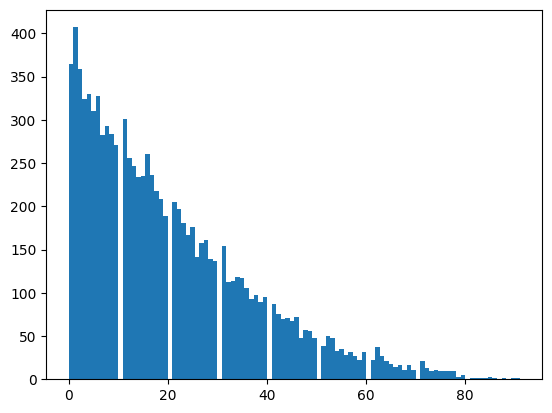

In [23]:
key1, key2 = jax.random.split(jax.random.PRNGKey(0),2)
dim = 100
alpha = 1.
beta = 4.
num_samples = 10000
condition_mask = jax.random.bernoulli(key1, jax.random.beta(key2,alpha, beta, shape=(num_samples,1)), shape=(num_samples,dim))
_ = plt.hist(condition_mask.sum(axis=1).flatten(), bins = 100)

In [54]:
import torch

for i in range(1, 10):
    x_o_sbibm = task.get_observation(i)[0]
    reference_posterior = task.get_reference_posterior_samples(i)
    
    x_o_sbibm = jnp.array(x_o_sbibm)
    condition_mask = jnp.array([0]*2 + [1]*2, dtype = bool)
    samples = sample_fn(jax.random.split(key, (10000,)), condition_mask, x_o_sbibm)
    
    print(c2st(torch.tensor(np.array(samples)), torch.tensor(np.array(reference_posterior))))

tensor([0.4980])
tensor([0.5064])
tensor([0.5055])
tensor([0.4974])
tensor([0.5045])
tensor([0.5023])
tensor([0.4978])
tensor([0.5019])
tensor([0.5021])


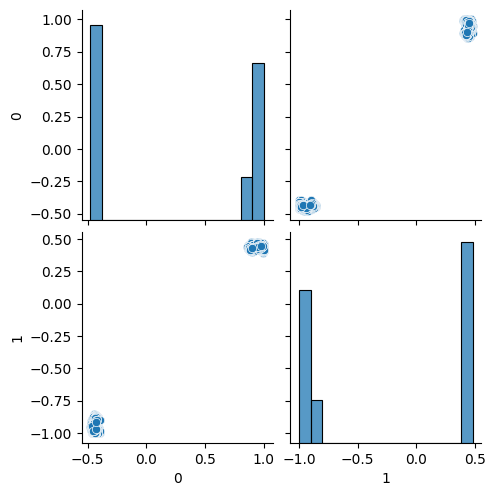

In [53]:
sns.pairplot(pd.DataFrame(samples))

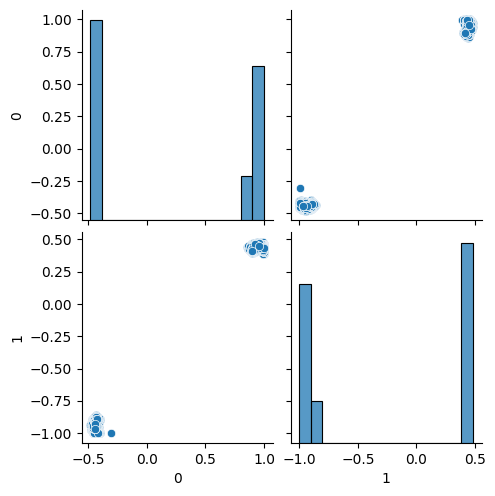

In [40]:
sns.pairplot(pd.DataFrame(reference_posterior))